<p><img style="padding: 0 15px; float: left;" src="Datasets/FTLogo300.jpg"
  alt="FT Crusader Logo" Width='140' Height= '250'/></p> 
<p> <h2> Minneapolis, MN, PreLease Housing Report 06/17/20</h2> <a name="tc"></a>
<p> <h3> By Abu Nayeem (Programmer & Co-Founder)</h3>

### Introduction

This report provides insight on the current Minneapolis rental market. The interactive maps and visualizations can allow people to explore their own community and can be a resource for activists and citizens alike. 

Here is some music below:

## Table of contents <a name="content"></a>
* [Purpose](#purpose)
* [Data](#data)
* [Audience Participation](#audience)
* [Overview](#overview)
    * [Plot: Minneapolis Rental Building Age by Building Size](#age)
    * [Map: Minneapolis Tier 2 & 3 geo-coordinates](#tier)
* [Landlord/ Housing Provider Breakdown](#owner)
    * [List: Dominant Providers](#big)
    * [Map: Properties by Single Owner](#prop)
* [Plot: New Rental Housing Construction by Community](#new)
    * [Map: New Rental Housing Construction](#newmap)
* [Interactive Community Data](#comm)
    * [Map: Powderhorn](#powder)
    * [Map: Northeast](#Northeast)
    * [Map: Near North](#NearNorth)
    * [Map: Camden](#Camden)
    * [Map: Calhoun Isle](#CalhounIsle)
    * [Map: University](#University)
    * [Map: Southwest](#Southwest)
    * [Map: Central](#Central)
    * [Map: Nokomis](#Nokomis)
    * [Map: Longfellow](#Longfellow)
    * [Map: Phillips](#Phillips)
* [Audience Participation Reminder](#reminder)
* [Functions_Run](#runall)

### About the Project <a name="purpose"></a>

PreLease seeks to partner with the public and government agencies. Our public reports are aimed to inform and engage the public. All coding and workbooks are publicly available on Github. We encourage others to contribute. In addition, our quality assurance services externally validates government data, so records are accurate. We are seeking to create an active customizable housing dashboard, but we need audience participations. More of this later     

If you use any material, data, and/or graphic from this report, please give credit to PreLease and to the developers. Also I'm the founder of the St. Paul Open Data Initiative, which provides open-source community reports similar to this project.   

### About the Data <a name="data"></a>

This report uses two public open datasets from Minneapolis open data portal
- [Active Rental Licenses](https://opendata.minneapolismn.gov/datasets/cityoflakes::active-rental-licenses/about)(primary): the city of Minneapolis requires housing providers to be licensed and must be renewed every year 
- [Assessors Parcel Data 2021](https://opendata.minneapolismn.gov/datasets/assessors-parcel-data-2021/explore): Hennepin County annually assesses the value of each property
- The datasets are linked with a common "Taxcode" given to a parcel. However, there are some inconsistencies with 1000 records omitted
- You can view the [data workbook] used in preparation of the report
- If you are Minneapolis and/or Hennepin county employee, please check the error table on entries and please correct them. (data cleaning is important
- I have used Python Programming and I recommend using Juptyer notebooks when reviewing this page

### Audience Participation <a name="audience"></a>

- Prior to viewing this report, fill out this Pre-Survey or signup 
- We want to build community community housing dashboards. Though we need more information from local tenants and/or housing providers. The information collected will not be publicly accessible and traceable to individuals. Please fill out this form
- Data Cleaning Help: Some data columns are messy due to inconsistent human input. Would you be interested in manually reviewing and cleaning the data? If so, contact me.

## Basic Overview <a name="overview"></a>

The city of Minneapolis has a population of 420,000 and with 90544 rental licensed units. The following two maps show the geographical breakdown by community and neighborhood. From the maps below, the Central community has the most licensed Units, and for neighborhoods, the Whittier and Marcy-Holmes neighborhoods have the most units. 

__Zoom in and hover your mouse over a region to view the number of units in area.__ 

In [3]:
Map_Comm() # Community Heat Map
Map_Nei() # Neighborhood Heat Map

Out of 21404 rental properties, 57% have 1 licensed Unit, while 8% have 7+ licensed Units. Also 15% of rental properties are owner/manager occupied.

In [47]:
(MS1['Units_Percent'].value_counts()*100/21404).round(2).reset_index().query("Units_Percent>1") 

,index,Units_Percent
0,1,57.25
1,2,25.33
2,4,4.16
3,3,2.87
4,5,1.13
5,6,1.04


In [48]:
(MS1['Owner_Occupied'].value_counts()*100/21404).round(2).reset_index() 

,index,Owner_Occupied
0,No,84.96
1,Yes,15.04


The table below shows __Total Percentage of Licensed Units by Property Type__. The majority of units are in apartments. 

In [50]:
p=['Property_Type', 'Units_Percent']
(MS1[p].groupby(['Property_Type',]).sum() *100/90544).round(2).query("Units_Percent>1").reset_index()    

,Property_Type,Units_Percent
0,APARTMENT,69.03
1,COMMERCIAL,2.36
2,CONDOMINIUM,3.61
3,DOUBLE BUNGALOW,13.89
4,RESIDENTIAL,7.52
5,TRIPLEX,2.05


The table below shows __Total Percentage of Licensed Units by Zoning__. Multi-family high density residential, and mixed building use zones cover most of the rental units. Nearly 28% of rental units are in low-density zones.  

In [49]:
p=['Zoning1', 'Units_Percent']
(MS1[p].groupby(['Zoning1',]).sum() *100/90544).round(2).query("Units_Percent>1").reset_index()   

,Zoning1,Units_Percent
0,Commerical,12.66
1,Downtown,10.58
2,Industrial,1.40
3,Mult_HighDensity_Residential,30.30
4,Mult_MedDensity_Residential,8.41
5,Office_Residential,9.74
6,Single_LowDensity_Residential,9.46
7,Two_LowDensity_Residential,17.40


### Rental Building Age <a name="age"></a>

The following plot displays the __age of the rental buildings__  based on number of Licensed_Units. Single/Duplex family rental units tend to be old buildings built around 1900-1920. Medium size apartments hover around the 1950s-70s. For large apartments, it is spaced out. There seems to be a trend that more housing were built after the end of WW1, and WW2, which were times of great prosperity.

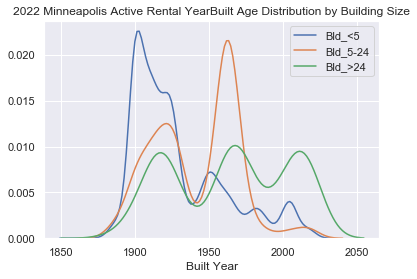

In [51]:
Plot_YearBuilt()

## Tier Ranking <a name="tier"></a>

The city of Minneapolis rate rental properties in a tier ranking, where tier 1 indicates good condition, tier 2 some issues, and tier 3 many issues. Tier 2 and 3 properties are inspected by the city a lot sooner than tier 1. Nearly 97.5% of rental properties are Tier 1. The following interactive map below displays all the active tier 2 and tier 3 properties.

__Zoom in and click on the circle for more details__ 
- Orange= tier 2  
- Green= tier 3

In [152]:
tier_MP()

### Housing Providers Breakdown <a name="owner"></a>

__Disclaimer:__ The underlying Owners data is a bit messy because there is no unique identifier for the owner/business and the property manager/owner that is applying for a rental license. 
- So it's possible the same owner owns two properties but misspelled or wrote their name/address differently on each form, so in my analysis they come us two different people
- It's possible there can be multiple owners can have the same name, and if grouped by name, multiple people can be merged as one
- __My method__ that I choose is to group by Owner and OwnerAdrress from the active rental license data base



Nearly 91% of housing providers own a single property. Nearly 75% of housing providers own 1-2 residential units. 

In [139]:
p=['Owner','ownerAddress1','Index','licensedUnits']
Owl=MS1[p].groupby(['Owner','ownerAddress1']).sum().reset_index() #.query("Units_Percent>50")  
Owl.rename(columns = {'Index':'Num_Properties'}, inplace = True)

#Number of Property Ownership
(Owl['Num_Properties'].value_counts()*100/ 17611).round(2).nlargest(3)#.query("Units_Percent>1")


1    90.74
2     5.48
3     1.78
Name: Num_Properties, dtype: float64

In [125]:
#Total Licensed Units Property number 
(Owl['licensedUnits'].value_counts()*100/ 17611).round(2).nlargest(4)

1    54.07
2    24.38
4     4.72
3     4.20
Name: licensedUnits, dtype: float64

## Who are the big housing providers? <a name="big"></a>

From the data, we can see multiple property household providers own many small properties. While the large housing properties, own a few properties. The top 20 (0.09%) housing providers own 8.6% total housing. The top 1% of housing providers own 33% of rental units.

In [144]:
#Top 10 Housing Providers by Total Licensed Units
Owl.sort_values('licensedUnits',ascending = False).head(10)#.sum() #7670', 29383 (1%) 

,Owner,ownerAddress1,Num_Properties,licensedUnits
3426,Cedar Riverside Ltd Ptnrshp,233 Park Ave S # 201,4,993
15311,Seward Towers Renovation,1080 Montreal Ave,2,640
1309,Aeon Preservation Lp,901 3Rd St N # 150,9,525
16886,Uptown Joint Vntr Phs Ii Llc,750 Bering Dr # 400,2,372
631,365 Nicollet Residences Llc,2711 Centerville Rd,1,370
6308,Gateway Owner Llc,One N Franklin Ste 700,1,360
7137,Im Loring Llc,225 Columbus Dr N # 100,1,354
294,240 Hennepin Prop Owner Llc,130 E Randolph St,1,346
10450,Lmc Ne Mpls L 2 Holdings Lp,433 Las Colinas Blvd - Ste 450,1,335
1339,Aimco Calhoun L L C,4582 Ulster Street Pkwy S,2,332


In [143]:
#Top 10 Housing Providers by Property Ownership
Owl.sort_values('Num_Properties',ascending = False).head(10)

,Owner,ownerAddress1,Num_Properties,licensedUnits
6102,Fyr Sfr Borrower Llc,3505 Koger Blvd #400,208,208
9775,Klp Real Estate Llc,338 2Nd St Ne - #200,49,80
3799,City Of Minneapolis,1808 Riverside Ave S Ste 201,33,87
7125,Ih2 Property Illinois Lp,1270 Eagan Industrial Rd # 160,32,32
13107,Park Ave Homes Llc,2400 Blaisdell Ave S #300,25,44
4607,Danlen Properties Llc,7040 Lakeland Ave N Ste 112,22,22
4610,Danmark Properties Llc,9617 Oak Ridge Trl,21,26
11034,Madison Ave Homes Llc,2400 Blaisdell Ave S #300,21,34
7238,J & M Homes Llc,2400 Blaisdell Ave # B2,19,23
6643,Gremar Properties Llc,821 Douglas Ave S # 400,19,107


## Properties by Single Owner <a name="prop"></a>

The interactive map below allows you to specify an owner's name, and you can view all the properties they own. We have selected the owner to be City of Minneapolis to create less controversy.

In [156]:
#You can select another property Owner
map_Own("City Of Minneapolis") 

## New Housing Construction <a name="new"></a>

To meet the growing city needs, the city of Minneapolis need to build new housing. From the graph below, we see that some communities are getting more housing than others with Central and University getting most of the housing Distribution. 

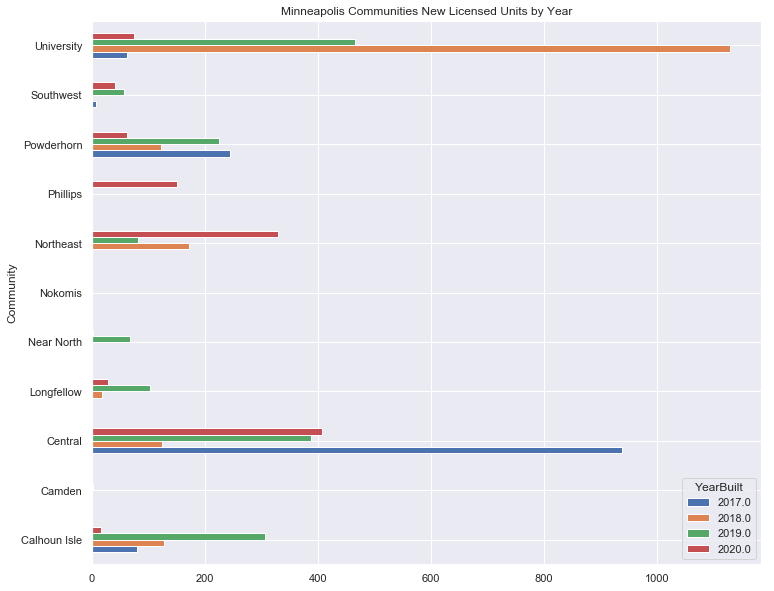

In [157]:
plot_NewHousing_by_Comm(2017) 

## New Rental Construction Map<a name="newmap"></a>

The interactive map displays 2020 new housing properties. Orange have small number of licensed units, green is medium, and purple is large

In [159]:
map_Housing_byYearBuilt(5,25,2020) #customizable (lower bound, upper_bound, _Year)

## Interactive  Community Data <a name="comm"></a>

We encourage you to explore your community. The underlying maps __exclude single licensed units__ because our program cannot process that much data. We hope to create dropdown interactive map for each individual neighborhood.

### Powderhorn <a name="powder"></a>

In [164]:
map_singleComm('Powderhorn') #2 licensed Units properties are excluded too

### Northeast <a name="Northeast"></a>

In [167]:
map_singleComm('Northeast')

### Near North <a name="Near North"></a>

In [168]:
map_singleComm('NearNorth')

### Camden <a name="Camden"></a>

In [178]:
map_singleComm('Camden')

### Calhoun Isle <a name="Calhoun Isle"></a>

In [170]:
map_singleComm('CalhounIsle')

### University <a name="University"></a>

In [171]:
map_singleComm('University')

### Southwest <a name="Southwest"></a>

In [172]:
map_singleComm('Southwest')

### Central <a name="Central"></a>

In [173]:
map_singleComm('Central')

### Nokomis <a name="Nokomis"></a>

In [174]:
map_singleComm('Nokomis')

### Longfellow <a name="Longfellow"></a>

In [177]:
map_singleComm('Longfellow')

### Phillips <a name="Phillips"></a>

In [176]:
map_singleComm('Phillips')

### Audience Participation Reminder <a name="reminder"></a>

- Are you interested in signing up and/or following Prelease. Sign up! 
- We want to build community community housing dashboards. Though we need more information from local tenants and/or housing providers. The information collected will not be publicly accessible and traceable to individuals. Please fill out this form
- Data Cleaning Help: Some data columns are messy due to inconsistent human input. Would you be interested in manually reviewing and cleaning the data? If so, contact me.

In [28]:
#ren.drop_duplicates(keep=False)

### Run the Code <a name="runall"></a>

Run this code before starting anything

In [188]:
#Graphing Chloropeth Maps
#Import Libraries & Load Data
import plotly.express as xp   # now it works
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import HTML
from IPython.display import display
import requests # library to handle requests
import folium
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
from IPython.display import Audio


#Audio Link
audio_link= 'Firewalk_10.m'

#Load 2021 Assessor Parcel Data; #Last Update 202111
MS1 = pd.read_csv('Minn_Report.csv')

#Corresponding Json Files for static maps
com_geo = r'Datasets/Minn_Communities.geojson'
nei_geo=r'Datasets/Minn_DetailComm.json'

#Create Standard Map for cloropeth
SP_map = folium.Map(location=[44.97833811654433,-93.28437562717569], zoom_start=13,tiles="OpenStreetMap")

#Chloropeth Map Community Level

def Map_Comm(ComNum=0): #I create a dummy variable function to make function operational
    if ComNum==0: 
        B=MS1 
    else: 
        B= MS1
    #specify the columns of interest
    p=['Community', 'licensedUnits'] 
    Map1=MS1[p].groupby(['Community']).sum().reset_index() #group by community and sum up values
    fig = px.choropleth_mapbox(Map1, geojson=com_geo, #select data, and json variable
                      locations=Map1['Community'], # what area you are mapping
                      color= Map1['licensedUnits'], # what is data of interest
                      color_continuous_scale="Viridis", #color scheme
                      #range_color=(0, 8),
                      featureidkey="properties.CommName", #looks at attribute of json
                      labels={'color':'Rental Units'}, #place name on legend
                      mapbox_style="carto-positron", # visual
                      opacity=0.4, #how much can you see below
                      center = {"lat": 44.97833811654433, "lon": -93.28437562717569}, #starting point of load
                      zoom=10) #zoom load map#animation_frame='dt_str')
    
    fig.update_geos(fitbounds="locations",visible=False)
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},)
    return fig.show()    

#Map_Comm() #this is the function to draw the graph

def Map_Nei(ComNum=0): #I create a dummy variable function to make function operational
    if ComNum==0: 
        B=MS1 
    else: 
        B= MS1
    p=['Neighborhood', 'licensedUnits'] #specify the precise data interested
    Map1=MS1[p].groupby(['Neighborhood']).sum().reset_index() #group by community and sum up values
    fig = px.choropleth_mapbox(Map1, geojson=nei_geo, #select data, and json variable for Neighborhood
                      locations=Map1['Neighborhood'], # what area you are mapping
                      color= Map1['licensedUnits'], # what is data of interest
                      color_continuous_scale="Viridis", #color scheme
                      #range_color=(0, 8),
                      featureidkey="properties.name", #looks at attribute of json
                      labels={'color':'Rental Units'}, #place name on legend
                      mapbox_style="carto-positron", # visual
                      opacity=0.4, #how much can you see below
                      center = {"lat": 44.97833811654433, "lon": -93.28437562717569}, #starting point of load
                      zoom=10) #zoom load map#animation_frame='dt_str')
    
    fig.update_geos(fitbounds="locations",visible=False)
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},)
    return fig.show()    

#Map_Nei() #this is the function to draw the graph

# Map by Owner

def map_Own(Owner="Fyr Sfr Borrower Llc"):
    B= MS1[(MS1['Owner']== Owner)]
    Index =['YearBuilt','tier','address','licensedUnits','Owner','longitude','latitude']

    FG_map = folium.Map(location=[44.97833811654433, -93.28437562717569], zoom_start=12,tiles="OpenStreetMap")
    
    B17=B[Index].groupby(['YearBuilt','tier','address','Owner','longitude','latitude']).sum().reset_index()
    for index, row in B17.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> tier: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row["tier"],row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row["longitude"]),
                            radius=row['licensedUnits']/3 +3,
                            color="#E37222",
                            popup=popup_text,
                            fill=True).add_to(FG_map)
    
    return FG_map    

#map_Own("Fyr Sfr Borrower Llc")



#Zoning

def map_Zoning(less=5,greater=25,Zoning="Industrial"):
    B= MS1[(MS1['Zoning1']== Zoning)]
    Index =['YearBuilt','address','licensedUnits','Owner','latitude','longitude','Zoning1']
    
    SP_map = folium.Map(location=[44.97833811654433, -93.28437562717569], zoom_start=12,tiles="OpenStreetMap")
    
    #Prepare the orange Points
    B17= B[(B['licensedUnits'] < less)]
    B17=B17[Index].groupby(['YearBuilt','address','Owner','latitude','longitude','Zoning1']).sum().reset_index()
    #Prepare Green Points
    B18= B[(B['licensedUnits'] >= less) & (B['licensedUnits'] <= greater)]
    B18=B18[Index].groupby(['YearBuilt','address','Owner','latitude','longitude','Zoning1']).sum().reset_index()
    #Prepare Purple Points
    B19= B[(B['licensedUnits'] > greater)]
    B19=B19[Index].groupby(['YearBuilt','address','Owner','latitude','longitude','Zoning1']).sum().reset_index()
    
    for index, row in B17.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> Zoning: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['Zoning1'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']+3,
                            color="#E37222",
                            popup=popup_text,
                            fill=True).add_to(SP_map)
    
    for index, row in B18.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> Zoning: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'],row['Zoning1'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']/2 +3,
                            color="#007849",
                            popup=popup_text,
                            fill=True).add_to(SP_map)
    
    for index, row in B19.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> Zoning: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'],row['Zoning1'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']/5 +3,
                            color="#800080",
                            popup=popup_text,
                            fill=True).add_to(SP_map)    
    
    return SP_map    

#map_Zoning()

#New Housing Construction and Year Built


def map_Housing_byYearBuilt(less=5,greater=25,Year=2020):
    B= MS1[(MS1['YearBuilt']== Year)]
    Index =['YearBuilt','address','licensedUnits','Owner','latitude','longitude']
    
    SP_map = folium.Map(location=[44.97833811654433, -93.28437562717569], zoom_start=12,tiles="OpenStreetMap")
    
    #Prepare the orange Points
    B17= B[(B['licensedUnits'] < less)]
    B17=B17[Index].groupby(['YearBuilt','address','Owner','latitude','longitude']).sum().reset_index()
    #Prepare Green Points
    B18= B[(B['licensedUnits'] >= less) & (B['licensedUnits'] <= greater)]
    B18=B18[Index].groupby(['YearBuilt','address','Owner','latitude','longitude']).sum().reset_index()
    #Prepare Purple Points
    B19= B[(B['licensedUnits'] > greater)]
    B19=B19[Index].groupby(['YearBuilt','address','Owner','latitude','longitude']).sum().reset_index()
    
    for index, row in B17.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']+3,
                            color="#E37222",
                            popup=popup_text,
                            fill=True).add_to(SP_map)
    
    for index, row in B18.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']/2 +3,
                            color="#007849",
                            popup=popup_text,
                            fill=True).add_to(SP_map)
    
    for index, row in B19.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row['latitude'],row['longitude']),
                            radius=row['licensedUnits']/5 +3,
                            color="#800080",
                            popup=popup_text,
                            fill=True).add_to(SP_map)    
    
    return SP_map    

#map_Housing_byYearBuilt(5,25,1954)


#tieerrr

def tier_MP(Bull=0):
    if Bull==0:
        B= MS1
    else: 
        B= MS1
    Index =['YearBuilt','tier','address','licensedUnits','Owner','longitude','latitude']

    FG_map = folium.Map(location=[44.97833811654433, -93.28437562717569], zoom_start=12,tiles="OpenStreetMap")
    
    B17=B.query('tier=="Tier 2"')
    B17=B17[Index].groupby(['YearBuilt','tier','address','Owner','longitude','latitude']).sum().reset_index()
    B18=B.query('tier=="Tier 3"')
    B18=B18[Index].groupby(['YearBuilt','tier','address','Owner','longitude','latitude']).sum().reset_index()

    for index, row in B17.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> tier: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row["tier"],row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row["longitude"]),
                            radius=row['licensedUnits']/3 +3,
                            color="#E37222",
                            popup=popup_text,
                            fill=True).add_to(FG_map)
    
    for index, row in B18.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> tier: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row["tier"],row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row["longitude"]),
                            radius=row['licensedUnits']/3 +3,
                            color="#007849",
                            popup=popup_text,
                            fill=True).add_to(FG_map) 
    
    return FG_map    

#tier_MP()



#Community Map  function
def commun(x): 
    if x=='Powderhorn':
        return 1
    elif x=='Northeast':
        return 2
    elif x=='Near North':
        return 3   
    elif x=='Camden':
        return 4
    elif x=='Calhoun Isle':
        return 5
    elif x=='University':
        return 6
    elif x=='Southwest':
        return 7
    elif x=='Central':
        return 8    
    elif x=='Nokomis':
        return 9    
    elif x=='Longfellow':
        return 10    
    elif x=='Phillips':
        return 11    
    else:
        return 18    

MS1['ComNum']= MS1['Community'].apply(commun)   
    
def map_singleComm(ComNum='None'): #for this to work new column needs to be last varaiable
    if ComNum=='None':
        B=MS1 
        zo= 12
    else: 
        B= MS1[(MS1['Community'] == ComNum)]
        zo=13
    
    #Set up Variable Zoom Locations
    data = [[0, [44.97833811654433, -93.28437562717569]],[1, [44.9442742,-93.2694218]], [2, [45.0122581,-93.2698428]], [3, [44.9917597,-93.2965591]],
            [4, [45.0321022,-93.3027441]], [5, [44.9592542,-93.3130592]],[6, [44.9761331,-93.2505983]],
            [7, [44.9139092,-93.3066585]], [8, [44.9770984,-93.2757725]], [9, [44.9084933,-93.2478909]],
           [10,[44.9490089,-93.228097]],[11,[44.9573043,-93.2613443]]]  
    #44.957334,-93.2602273
    # Create the pandas DataFrame 
    Loc = pd.DataFrame(data, columns = ['Community', 'Location']) 
    #Loc.iloc[ComNum,1:]    
    
    # generate a new map
    FG_map = folium.Map(location=Loc.iloc[B.iat[0,-1],1], zoom_start=zo,tiles='OpenStreetMap') #tiles="OpenStreetMap")

    
    Index =['YearBuilt','address','licensedUnits','Owner','longitude','latitude']
    if ComNum=="Powderhorn": #Powderhorn has excluded duplex (2 units)
        B17=B.query('licensedUnits in (3,4)')
    else: 
        B17=B.query('licensedUnits in (2,3,4)')
    B17=B17[Index].groupby(['YearBuilt','address','Owner','longitude','latitude']).sum().reset_index()
    B18=B.query('(licensedUnits> 4) and (licensedUnits< 25)')
    B18=B18[Index].groupby(['YearBuilt','address','Owner','longitude','latitude']).sum().reset_index()
    B19=B.query('licensedUnits>24')
    B19=B19[Index].groupby(['YearBuilt','address','Owner','longitude','latitude']).sum().reset_index()

    for index, row in B17.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row['longitude']),
                            radius=row['licensedUnits']/5 +3,
                            color="#E37222",
                            popup=popup_text,
                            fill=True).add_to(FG_map)
    
    for index, row in B18.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row['longitude']),
                            radius=row['licensedUnits']/5 +3,
                            color="#007849",
                            popup=popup_text,
                            fill=True).add_to(FG_map)
    
    for index, row in B19.iterrows(): 
        popup_text = "Year: {}<br> Address: {}<br> Owner: {}<br> #Units: {}"
        popup_text = popup_text.format(row["YearBuilt"],row["address"], row['Owner'], row['licensedUnits'])
        folium.CircleMarker(location=(row["latitude"],row['longitude']),
                            radius=row['licensedUnits']/5 +3,
                            color="#800080",
                            popup=popup_text,
                            fill=True).add_to(FG_map)    
    
    return FG_map    

#map_singleComm('Powderhorn')



#New Housing by Community from 2016-2020
def plot_NewHousing_by_Comm(MinYear=2017):
    B= MS1[(MS1['YearBuilt'] >= MinYear)] # specify data 
    Index= ['YearBuilt','Community','licensedUnits'] # choose columns of interest
    C= B[Index].groupby(['YearBuilt','Community']).sum().reset_index()    #prepare data
    #print('This graph displays total residential licensed units by community per year for Minneapolis')
    sns.set()
    pd.pivot_table(C, #data
                   values='licensedUnits', 
                   index=['Community'], 
                   columns=['YearBuilt'], 
                    fill_value=0).plot(kind= 'barh', #type of bar graph
                    figsize=(12,10),title= 'Minneapolis Communities New Licensed Units by Year')    
    return plt.show()

#plot_NewHousing_by_Comm(2017) #You can adjust the year

# YearBuilt multiple values graph
def Plot_YearBuilt(Bull=0):
    if Bull==0:
        B= MS1
    else: 
        B= MS1
    #Graphing using seaborn
    sns.set_style("darkgrid") #white, white-grid, ticks
    ax= sns.kdeplot(MS1.query('licensedUnits<5').YearBuilt, label='Bld_<5')
    sns.kdeplot(MS1.query('(licensedUnits> 4) and (licensedUnits< 25)').YearBuilt, label='Bld_5-24')
    sns.kdeplot(MS1.query('licensedUnits>24').YearBuilt, label='Bld_>24')

    ax.set_title('2022 Minneapolis Active Rental YearBuilt Age Distribution by Building Size')
    plt.xlabel('Built Year', fontsize=12)
    
    return    

#Plot_YearBuilt()

